# Segmentación de Instancias de Vehículos con RTMDet-Ins

**Univ.:** Joel Galvan  
**Modelo:** RTMDet-Ins Small (2022-2023) — Modelo de **1 etapa**  
**Dataset:** Dataset propio de vehículos anotado en Roboflow (COCO JSON Segmentation)  
**Clases:** car, motorcycle, truck  
**Framework:** MMDetection 3.x  
**División:** 80% train / 10% val / 10% test  

---

## Contexto del Modelo

**RTMDet-Ins** es un detector de instancias de **una sola etapa** publicado por Shanghai AI Laboratory en 2022-2023.
A diferencia de Cascade Mask R-CNN (dos etapas), RTMDet-Ins predice directamente las máscaras
de segmentación y bounding boxes sin una etapa intermedia de propuestas de región.

**Componentes clave:**
- **Backbone:** CSPNeXt — CNN modernizada con bloques de atención de kernel grande
- **Neck:** CSPNeXt PANeck — agrega características multi-escala bidireccional
- **Head:** RTMDet Head con dynamic soft label assignment y kernels dinámicos para máscaras

**Referencia:** Lyu et al., *RTMDet: An Empirical High-Performance Real-Time Instance Segmentation Detector*, 2022. https://arxiv.org/abs/2212.07784

## Celda 1 — Verificación del entorno

In [1]:
import torch
import mmdet
import mmcv
import mmengine

print('=== Verificación del entorno ===')
print(f'PyTorch:         {torch.__version__}')
print(f'CUDA disponible: {torch.cuda.is_available()}')
if torch.cuda.is_available():
    print(f'GPU:             {torch.cuda.get_device_name(0)}')
    print(f'VRAM:            {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB')
print(f'MMDet:           {mmdet.__version__}')
print(f'MMCV:            {mmcv.__version__}')
print(f'MMEngine:        {mmengine.__version__}')

# Verificar CUDA NMS
from mmcv.ops import nms
boxes  = torch.tensor([[0,0,10,10],[1,1,11,11]], dtype=torch.float32).cuda()
scores = torch.tensor([0.9, 0.8], dtype=torch.float32).cuda()
keep, _ = nms(boxes, scores, iou_threshold=0.5)
print(f'CUDA NMS:        OK')
print('\n✅ Entorno listo.')

=== Verificación del entorno ===
PyTorch:         2.1.0+cu121
CUDA disponible: True
GPU:             NVIDIA GeForce GTX 1650
VRAM:            4.3 GB
MMDet:           3.3.0
MMCV:            2.1.0
MMEngine:        0.10.7
CUDA NMS:        OK

✅ Entorno listo.


## Celda 2 — Importaciones y configuración de rutas

In [ ]:
import os
import json
import shutil
import random
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from pathlib import Path
from PIL import Image
from tqdm import tqdm

# ─── Configuración de rutas 
DATASET_ROOT  = Path('C:/Users/luisc/OneDrive/Documents/SeptimoSemestre/IA2026/La6/v2')
TRAIN_DIR     = DATASET_ROOT / 'train'
TRAIN_JSON    = TRAIN_DIR / '_annotations_clean.coco.json'  

# Directorio de splits
SPLIT_DIR     = DATASET_ROOT / 'splits'
SPLIT_DIR.mkdir(parents=True, exist_ok=True)
for sub in ['train', 'val', 'test']:
    (SPLIT_DIR / sub / 'images').mkdir(parents=True, exist_ok=True)

SPLIT_ABS_STR = str(SPLIT_DIR.resolve()).replace('\\', '/')

# Proporciones
TRAIN_RATIO = 0.80
VAL_RATIO   = 0.10
TEST_RATIO  = 0.10
RANDOM_SEED = 42
random.seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)

assert TRAIN_DIR.exists(),  f'❌ No se encontró: {TRAIN_DIR}'
assert TRAIN_JSON.exists(), f'❌ No se encontró: {TRAIN_JSON}'

print(f'Dataset root:  {DATASET_ROOT.resolve()}')
print(f'Anotaciones:   {TRAIN_JSON}')
print(f'División:      {int(TRAIN_RATIO*100)}% / {int(VAL_RATIO*100)}% / {int(TEST_RATIO*100)}%')
print('✅ Rutas configuradas.')

Dataset root:  C:\Users\luisc\OneDrive\Documents\SeptimoSemestre\IA2026\La6\v2
Anotaciones:   C:\Users\luisc\OneDrive\Documents\SeptimoSemestre\IA2026\La6\v2\train\_annotations_clean.coco.json
División:      80% / 10% / 10%
✅ Rutas configuradas.


## Celda 3 — Exploración del dataset

In [3]:
with open(TRAIN_JSON) as f:
    coco_data = json.load(f)

images      = coco_data['images']
annotations = coco_data['annotations']
categories  = coco_data['categories']

CATEGORY_NAMES = tuple(cat['name'] for cat in sorted(categories, key=lambda c: c['id']))
NUM_CLASSES    = len(CATEGORY_NAMES)

print('=== Estadísticas del Dataset ===')
print(f'Total imágenes:    {len(images)}')
print(f'Total anotaciones: {len(annotations)}')
print(f'Clases ({NUM_CLASSES}):       {CATEGORY_NAMES}')

cat_map = {c['id']: c['name'] for c in categories}
print('\nAnotaciones por clase:')
for cat in categories:
    count = sum(1 for a in annotations if a['category_id'] == cat['id'])
    tiene_segm = sum(1 for a in annotations if a['category_id'] == cat['id'] and a.get('segmentation'))
    print(f'  {cat["name"]}: {count} instancias ({tiene_segm} con polígono)')

=== Estadísticas del Dataset ===
Total imágenes:    106
Total anotaciones: 256
Clases (3):       ('car', 'motorcycle', 'truck')

Anotaciones por clase:
  car: 165 instancias (165 con polígono)
  motorcycle: 44 instancias (44 con polígono)
  truck: 47 instancias (47 con polígono)


## Celda 4 — División del dataset (80% / 10% / 10%)

In [4]:
def split_coco_dataset(coco_data, train_ratio, val_ratio, test_ratio, seed=42):
    all_images = coco_data['images'].copy()
    random.seed(seed)
    random.shuffle(all_images)
    n       = len(all_images)
    n_train = int(n * train_ratio)
    n_val   = int(n * val_ratio)
    train_imgs = all_images[:n_train]
    val_imgs   = all_images[n_train:n_train + n_val]
    test_imgs  = all_images[n_train + n_val:]

    def build_split(img_list):
        img_ids = {img['id'] for img in img_list}
        return {
            'info':        coco_data.get('info', {}),
            'licenses':    coco_data.get('licenses', []),
            'categories':  coco_data['categories'],
            'images':      img_list,
            'annotations': [a for a in coco_data['annotations'] if a['image_id'] in img_ids]
        }
    return build_split(train_imgs), build_split(val_imgs), build_split(test_imgs)


def copy_images(img_list, src_dir, dst_dir):
    dst_dir.mkdir(parents=True, exist_ok=True)
    missing = 0
    for img in tqdm(img_list, desc=f'Copiando {dst_dir.parent.name}/'):
        src = src_dir / img['file_name']
        dst = dst_dir / img['file_name']
        if src.exists():
            shutil.copy2(src, dst)
        else:
            missing += 1
    if missing:
        print(f'  ⚠️ {missing} imágenes no encontradas.')


print('Dividiendo dataset...')
train_coco, val_coco, test_coco = split_coco_dataset(
    coco_data, TRAIN_RATIO, VAL_RATIO, TEST_RATIO, seed=RANDOM_SEED
)

# Guardar JSONs
for name, data in [('train', train_coco), ('val', val_coco), ('test', test_coco)]:
    p = SPLIT_DIR / name / '_annotations.coco.json'
    with open(p, 'w') as f:
        json.dump(data, f)
    print(f'[{name}] {len(data["images"]):>3} imágenes | {len(data["annotations"]):>3} anotaciones')

# Copiar imágenes
print('\nCopiando imágenes...')
copy_images(train_coco['images'], TRAIN_DIR, SPLIT_DIR / 'train' / 'images')
copy_images(val_coco['images'],   TRAIN_DIR, SPLIT_DIR / 'val'   / 'images')
copy_images(test_coco['images'],  TRAIN_DIR, SPLIT_DIR / 'test'  / 'images')
print('\n✅ División completada.')

Dividiendo dataset...
[train]  84 imágenes | 203 anotaciones
[val]  10 imágenes |  24 anotaciones
[test]  12 imágenes |  29 anotaciones

Copiando imágenes...


Copiando test/: 100%|██████████| 12/12 [00:00<00:00, 195.27it/s]


✅ División completada.


## Celda 5 — Visualización de muestras con polígonos

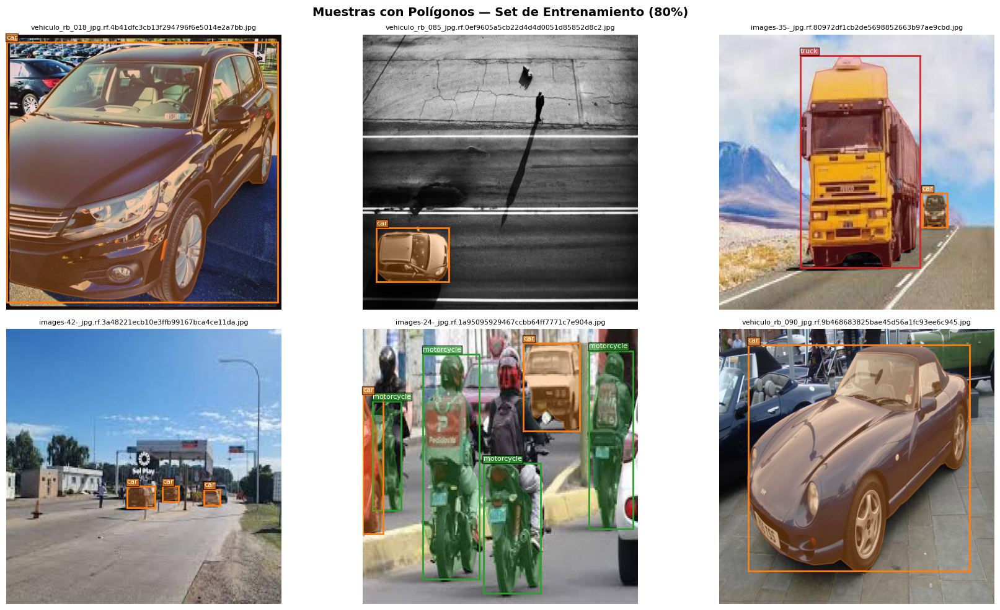

In [5]:
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection

def visualize_segmentation_samples(json_path, images_dir, n_samples=6, title='Muestras'):
    with open(json_path) as f:
        data = json.load(f)

    cat_map    = {c['id']: c['name'] for c in data['categories']}
    ann_by_img = {}
    for ann in data['annotations']:
        ann_by_img.setdefault(ann['image_id'], []).append(ann)

    samples = random.sample(data['images'], min(n_samples, len(data['images'])))
    cols = 3
    rows = (len(samples) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(18, rows * 5))
    axes = axes.flatten()
    colors = plt.cm.tab10.colors

    for ax, img_info in zip(axes, samples):
        img_path = images_dir / img_info['file_name']
        if not img_path.exists():
            ax.set_visible(False)
            continue
        img = Image.open(img_path).convert('RGB')
        ax.imshow(img)

        for ann in ann_by_img.get(img_info['id'], []):
            color = colors[ann['category_id'] % len(colors)]
            # Dibujar bbox
            x, y, w, h = ann['bbox']
            rect = patches.Rectangle((x, y), w, h, linewidth=2,
                                      edgecolor=color, facecolor='none')
            ax.add_patch(rect)
            # Dibujar polígono de segmentación
            if ann.get('segmentation'):
                for seg in ann['segmentation']:
                    pts = np.array(seg).reshape(-1, 2)
                    poly = Polygon(pts, closed=True, fill=True,
                                   facecolor=color, alpha=0.3, edgecolor=color, linewidth=1.5)
                    ax.add_patch(poly)
            ax.text(x, y-4, cat_map.get(ann['category_id'], '?'),
                    color='white', fontsize=8,
                    bbox=dict(facecolor=color, alpha=0.7, pad=1))

        ax.set_title(img_info['file_name'], fontsize=8)
        ax.axis('off')

    for ax in axes[len(samples):]:
        ax.set_visible(False)
    fig.suptitle(title, fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

visualize_segmentation_samples(
    SPLIT_DIR / 'train' / '_annotations.coco.json',
    SPLIT_DIR / 'train' / 'images',
    n_samples=6,
    title='Muestras con Polígonos — Set de Entrenamiento (80%)'
)

## Celda 6 — Registro del dataset en MMDetection

In [6]:
from mmdet.registry import DATASETS
from mmdet.datasets import CocoDataset
from mmdet.utils import register_all_modules

register_all_modules(init_default_scope=True)

@DATASETS.register_module(force=True)
class VehicleSegDataset(CocoDataset):
    """Dataset de vehículos para segmentación de instancias."""
    METAINFO = {
        'classes': CATEGORY_NAMES,
        'palette': [(220, 20, 60), (0, 128, 0), (0, 0, 255)]
    }

print(f'Categorías: {CATEGORY_NAMES}')
print(f'Clases:     {NUM_CLASSES}')
print('✅ VehicleSegDataset registrado.')

Categorías: ('car', 'motorcycle', 'truck')
Clases:     3
✅ VehicleSegDataset registrado.


## Celda 7 — Descarga del config oficial de RTMDet-Ins

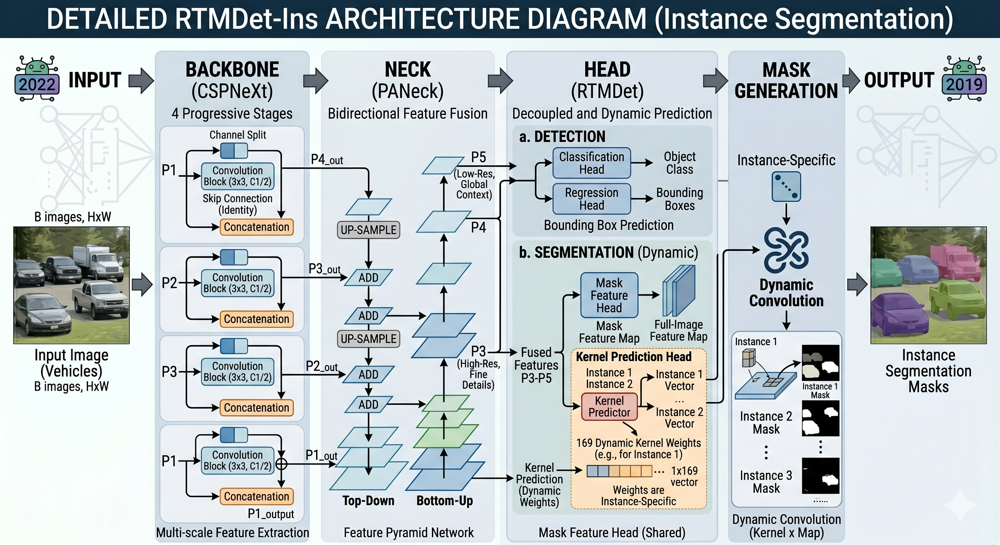

In [7]:
import subprocess

WORK_DIR = Path('./work_dirs/rtmdet_ins_vehicles')
WORK_DIR.mkdir(parents=True, exist_ok=True)
WORK_DIR_STR = str(WORK_DIR.resolve()).replace('\\', '/')

result = subprocess.run([
    'mim', 'download', 'mmdet',
    '--config', 'rtmdet-ins_s_8xb32-300e_coco',
    '--dest', str(WORK_DIR)
], capture_output=True, text=True)

print(result.stdout)
if result.stderr:
    print(result.stderr[:500])

base_cfgs = list(WORK_DIR.glob('rtmdet*ins*.py'))
print(f'Configs encontrados: {base_cfgs}')

processing rtmdet-ins_s_8xb32-300e_coco...
downloading ---------------------------------------- 0.0/39.1 MiB ? eta -:--:--
downloading ---------------------------------------- 0.0/39.1 MiB ? eta -:--:--
downloading ---------------------------------------- 0.0/39.1 MiB ? eta -:--:--
downloading ------------------------------- 0.0/39.1 MiB 122.1 kB/s eta 0:05:36
downloading ------------------------------- 0.0/39.1 MiB 250.0 kB/s eta 0:02:44
downloading ------------------------------- 0.0/39.1 MiB 234.2 kB/s eta 0:02:55
downloading ------------------------------- 0.1/39.1 MiB 204.0 kB/s eta 0:03:21
downloading ------------------------------- 0.1/39.1 MiB 258.5 kB/s eta 0:02:39
downloading ------------------------------- 0.1/39.1 MiB 330.9 kB/s eta 0:02:04
downloading ------------------------------- 0.1/39.1 MiB 292.6 kB/s eta 0:02:20
downloading ------------------------------- 0.2/39.1 MiB 370.7 kB/s eta 0:01:51
downloading ------------------------------- 0.2/39.1 MiB 444.4 kB/s eta 0:01:

## Celda 8 — Configuración y entrenamiento

In [ ]:
from mmengine.config import Config
from mmengine.runner import Runner
from mmdet.utils import register_all_modules

register_all_modules(init_default_scope=True)

# Cargar config oficial
base_cfg_path = list(WORK_DIR.glob('rtmdet*ins*.py'))[0]
cfg = Config.fromfile(str(base_cfg_path))

# ── Work dir 
cfg.work_dir = WORK_DIR_STR

# ── Número de clases 
cfg.model.bbox_head.num_classes = NUM_CLASSES

# ── Dataset train 
cfg.train_dataloader.dataset.type        = 'VehicleSegDataset'
cfg.train_dataloader.dataset.data_root   = f'{SPLIT_ABS_STR}/train/'
cfg.train_dataloader.dataset.ann_file    = '_annotations.coco.json'
cfg.train_dataloader.dataset.data_prefix = dict(img='images/')

# ── Dataset val 
cfg.val_dataloader.dataset.type          = 'VehicleSegDataset'
cfg.val_dataloader.dataset.data_root     = f'{SPLIT_ABS_STR}/val/'
cfg.val_dataloader.dataset.ann_file      = '_annotations.coco.json'
cfg.val_dataloader.dataset.data_prefix   = dict(img='images/')

# ── Dataset test 
cfg.test_dataloader.dataset.type         = 'VehicleSegDataset'
cfg.test_dataloader.dataset.data_root    = f'{SPLIT_ABS_STR}/test/'
cfg.test_dataloader.dataset.ann_file     = '_annotations.coco.json'
cfg.test_dataloader.dataset.data_prefix  = dict(img='images/')

# ── Evaluadores 
cfg.val_evaluator.ann_file  = f'{SPLIT_ABS_STR}/val/_annotations.coco.json'
cfg.test_evaluator.ann_file = f'{SPLIT_ABS_STR}/test/_annotations.coco.json'

# ── Entrenamiento 
cfg.train_cfg.max_epochs            = 40
cfg.train_dataloader.batch_size     = 2
cfg.train_dataloader.num_workers    = 0
cfg.train_dataloader.persistent_workers = False
cfg.val_dataloader.num_workers      = 0
cfg.val_dataloader.persistent_workers   = False
cfg.test_dataloader.num_workers     = 0
cfg.test_dataloader.persistent_workers  = False

# ── Checkpoint 
cfg.default_hooks.checkpoint = dict(
    type='CheckpointHook',
    interval=5,
    save_best='coco/bbox_mAP',
    rule='greater',
    max_keep_ckpts=2
)

print('=== Resumen de la configuración ===')
print(f'Modelo:     {cfg.model.type}')
print(f'Clases:     {NUM_CLASSES} {CATEGORY_NAMES}')
print(f'Épocas:     {cfg.train_cfg.max_epochs}')
print(f'Work dir:   {cfg.work_dir}')
print(f'GPU:        {torch.cuda.get_device_name(0) if torch.cuda.is_available() else "CPU"}')
print('\n🚀 Iniciando entrenamiento...')
print('-' * 60)

runner = Runner.from_cfg(cfg)
runner.train()

=== Resumen de la configuración ===
Modelo:     RTMDet
Clases:     3 ('car', 'motorcycle', 'truck')
Épocas:     40
Work dir:   C:/Users/luisc/OneDrive/Documents/SeptimoSemestre/IA2026/La6/work_dirs/rtmdet_ins_vehicles
GPU:        NVIDIA GeForce GTX 1650

🚀 Iniciando entrenamiento...
------------------------------------------------------------
05/21 18:10:11 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: win32
    Python: 3.10.20 | packaged by Anaconda, Inc. | (main, Mar 11 2026, 17:42:35) [MSC v.1942 64 bit (AMD64)]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 1608637542
    GPU 0: NVIDIA GeForce GTX 1650
    CUDA_HOME: C:\Program Files\NVIDIA GPU Computing Toolkit\CUDA\v12.8
    NVCC: Cuda compilation tools, release 12.8, V12.8.93
    GCC: n/a
    PyTorch: 2.1.0+cu121
    PyTorch compiling details: PyTorch built with:
  - C++ Version: 199711
  - MSVC 192930151
  - Intel(R) Math Kernel

Downloading: "https://download.openmmlab.com/mmdetection/v3.0/rtmdet/cspnext_rsb_pretrain/cspnext-s_imagenet_600e.pth" to C:\Users\luisc/.cache\torch\hub\checkpoints\cspnext-s_imagenet_600e.pth


05/21 18:11:08 - mmengine - WARNING - "FileClient" will be deprecated in future. Please use io functions in https://mmengine.readthedocs.io/en/latest/api/fileio.html#file-io
05/21 18:11:08 - mmengine - WARNING - "HardDiskBackend" is the alias of "LocalBackend" and the former will be deprecated in future.
05/21 18:11:08 - mmengine - INFO - Checkpoints will be saved to C:\Users\luisc\OneDrive\Documents\SeptimoSemestre\IA2026\La6\work_dirs\rtmdet_ins_vehicles.


c:\Users\luisc\.conda\envs\openmmlab\lib\site-packages\torch\functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ..\aten\src\ATen\native\TensorShape.cpp:3527.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


05/21 18:12:04 - mmengine - INFO - Exp name: rtmdet-ins_s_8xb32-300e_coco_20260521_180953
05/21 18:12:11 - mmengine - INFO - Epoch(train)  [1][42/42]  base_lr: 1.6420e-04 lr: 1.6420e-04  eta: 0:35:28  time: 1.2997  data_time: 0.3859  memory: 1321  loss: 3.6664  loss_cls: 0.7100  loss_bbox: 1.3131  loss_mask: 1.6433
05/21 18:12:38 - mmengine - INFO - Exp name: rtmdet-ins_s_8xb32-300e_coco_20260521_180953
05/21 18:12:38 - mmengine - INFO - Epoch(train)  [2][42/42]  base_lr: 3.3237e-04 lr: 3.3237e-04  eta: 0:25:59  time: 0.6600  data_time: 0.2830  memory: 1321  loss: 3.2572  loss_cls: 0.6808  loss_bbox: 1.2309  loss_mask: 1.3454
05/21 18:13:01 - mmengine - INFO - Exp name: rtmdet-ins_s_8xb32-300e_coco_20260521_180953
05/21 18:13:01 - mmengine - INFO - Epoch(train)  [3][42/42]  base_lr: 5.0054e-04 lr: 5.0054e-04  eta: 0:21:28  time: 0.5492  data_time: 0.2156  memory: 1440  loss: 2.8965  loss_cls: 0.7463  loss_bbox: 1.1569  loss_mask: 0.9933
05/21 18:13:21 - mmengine - INFO - Exp name: rtmd

RTMDet(
  (data_preprocessor): DetDataPreprocessor()
  (backbone): CSPNeXt(
    (stem): Sequential(
      (0): ConvModule(
        (conv): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): _BatchNormXd(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (activate): SiLU(inplace=True)
      )
      (1): ConvModule(
        (conv): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn): _BatchNormXd(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (activate): SiLU(inplace=True)
      )
      (2): ConvModule(
        (conv): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn): _BatchNormXd(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (activate): SiLU(inplace=True)
      )
    )
    (stage1): Sequential(
      (0): ConvModule(
        (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), pad

## Celda 9 — Evaluación en TEST

In [ ]:
from mmengine.runner import Runner
import glob
import os

ckpts = sorted(
    glob.glob(str(WORK_DIR / 'best_coco_bbox_mAP_epoch_*.pth')),
    key=os.path.getmtime
)
if not ckpts:
    ckpts = sorted(glob.glob(str(WORK_DIR / '*.pth')), key=os.path.getmtime)

best_checkpoint = ckpts[-1]
print(f'Checkpoint: {best_checkpoint}')

cfg_test = cfg.copy()
cfg_test.load_from = best_checkpoint

runner_test = Runner.from_cfg(cfg_test)
print('\n🔍 Evaluando sobre set de TEST...')
metrics = runner_test.test()

print('\n=== Resultados finales en TEST ===')
for k, v in metrics.items():
    print(f'  {k}: {v:.4f}')

Checkpoint: work_dirs\rtmdet_ins_vehicles\best_coco_bbox_mAP_epoch_20.pth
05/21 18:32:07 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: win32
    Python: 3.10.20 | packaged by Anaconda, Inc. | (main, Mar 11 2026, 17:42:35) [MSC v.1942 64 bit (AMD64)]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 1368067321
    GPU 0: NVIDIA GeForce GTX 1650
    CUDA_HOME: C:\Program Files\NVIDIA GPU Computing Toolkit\CUDA\v12.8
    NVCC: Cuda compilation tools, release 12.8, V12.8.93
    GCC: n/a
    PyTorch: 2.1.0+cu121
    PyTorch compiling details: PyTorch built with:
  - C++ Version: 199711
  - MSVC 192930151
  - Intel(R) Math Kernel Library Version 2020.0.2 Product Build 20200624 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v3.1.1 (Git Hash 64f6bcbcbab628e96f33a62c3e975f8535a7bde4)
  - OpenMP 2019
  - LAPACK is enabled (usually provided by MKL)
  - CPU capability usage: AVX512
  -

c:\Users\luisc\.conda\envs\openmmlab\lib\site-packages\mmengine\utils\manager.py:113: UserWarning: <class 'mmdet.visualization.local_visualizer.DetLocalVisualizer'> instance named of visualizer has been created, the method `get_instance` should not accept any other arguments
  warnings.warn(


05/21 18:32:16 - mmengine - INFO - Distributed training is not used, all SyncBatchNorm (SyncBN) layers in the model will be automatically reverted to BatchNormXd layers if they are used.
05/21 18:32:16 - mmengine - INFO - Hooks will be executed in the following order:
before_run:
(VERY_HIGH   ) RuntimeInfoHook                    
(49          ) EMAHook                            
(BELOW_NORMAL) LoggerHook                         
 -------------------- 
after_load_checkpoint:
(49          ) EMAHook                            
 -------------------- 
before_train:
(VERY_HIGH   ) RuntimeInfoHook                    
(49          ) EMAHook                            
(NORMAL      ) IterTimerHook                      
(VERY_LOW    ) CheckpointHook                     
 -------------------- 
before_train_epoch:
(VERY_HIGH   ) RuntimeInfoHook                    
(NORMAL      ) IterTimerHook                      
(NORMAL      ) DistSamplerSeedHook                
(NORMAL      ) PipelineSwitchHoo

## Celda 10 — Inferencia y visualización de segmentaciones

Loads checkpoint by local backend from path: work_dirs\rtmdet_ins_vehicles\best_coco_bbox_mAP_epoch_20.pth


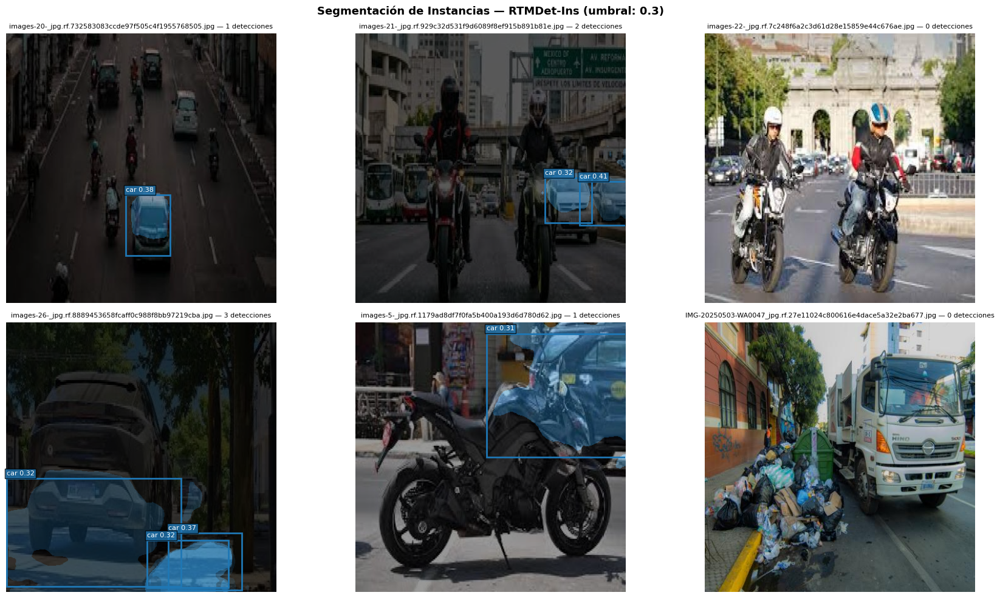

In [10]:
from mmdet.apis import init_detector, inference_detector
from mmdet.utils import register_all_modules
import mmcv
import numpy as np

register_all_modules(init_default_scope=True)

model_infer = init_detector(
    str(base_cfg_path),
    best_checkpoint,
    device='cuda:0' if torch.cuda.is_available() else 'cpu'
)

test_images = list((SPLIT_DIR / 'test' / 'images').glob('*.jpg'))[:6]
if not test_images:
    test_images = list((SPLIT_DIR / 'test' / 'images').glob('*.png'))[:6]

assert test_images, '❌ No se encontraron imágenes en test.'

cols = 3
rows = (len(test_images) + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(18, rows * 5))
axes = axes.flatten()
colors = plt.cm.tab10.colors

for ax, img_path in zip(axes, test_images):
    result = inference_detector(model_infer, str(img_path))
    img    = mmcv.imread(str(img_path), channel_order='rgb').copy()

    pred = result.pred_instances
    scores = pred.scores.cpu().numpy()
    labels = pred.labels.cpu().numpy()
    bboxes = pred.bboxes.cpu().numpy()

    # Obtener máscaras si existen
    masks = None
    if hasattr(pred, 'masks'):
        masks = pred.masks.cpu().numpy()

    ax.imshow(img)
    detectados = 0
    for i, (score, label, bbox) in enumerate(zip(scores, labels, bboxes)):
        if score < 0.3:
            continue
        detectados += 1
        color = colors[int(label) % len(colors)]

        # Dibujar máscara
        if masks is not None and i < len(masks):
            mask = masks[i]
            overlay = np.zeros_like(img, dtype=np.uint8)
            overlay[mask] = [int(c*255) for c in color[:3]]
            ax.imshow(overlay, alpha=0.4)

        # Dibujar bbox
        x1, y1, x2, y2 = bbox
        rect = patches.Rectangle((x1, y1), x2-x1, y2-y1,
                                  linewidth=2, edgecolor=color, facecolor='none')
        ax.add_patch(rect)
        cls_name = CATEGORY_NAMES[int(label)] if int(label) < len(CATEGORY_NAMES) else str(label)
        ax.text(x1, y1-5, f'{cls_name} {score:.2f}', color='white', fontsize=8,
                bbox=dict(facecolor=color, alpha=0.8, pad=2))

    ax.set_title(f'{img_path.name} — {detectados} detecciones', fontsize=8)
    ax.axis('off')

for ax in axes[len(test_images):]:
    ax.set_visible(False)

fig.suptitle('Segmentación de Instancias — RTMDet-Ins (umbral: 0.3)',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

## Celda 11 — Curvas de entrenamiento

Leyendo log: work_dirs\rtmdet_ins_vehicles\20260521_180953\vis_data\scalars.json


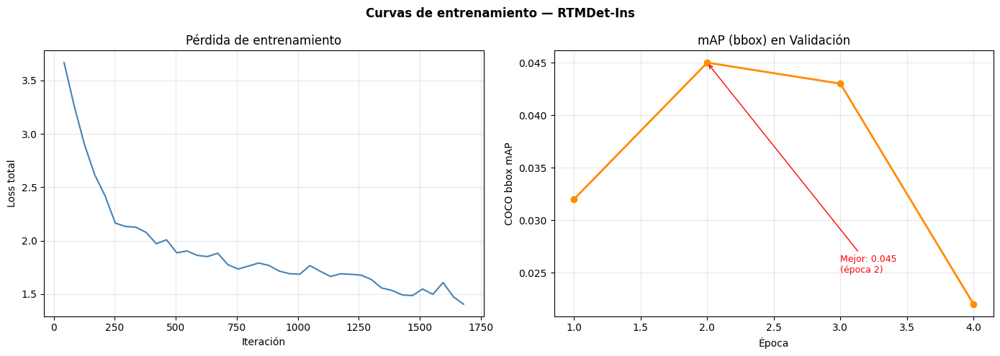

In [11]:
import json as json_lib

log_files = sorted(WORK_DIR.glob('*/vis_data/scalars.json'))
if not log_files:
    print('⚠️ No se encontraron logs.')
else:
    log_path = log_files[-1]  # más reciente
    print(f'Leyendo log: {log_path}')

    train_loss, val_map = [], []
    with open(log_path) as f:
        for line in f:
            try:
                entry = json_lib.loads(line.strip())
                if 'loss' in entry:
                    train_loss.append(entry)
                if 'coco/bbox_mAP' in entry:
                    val_map.append(entry)
            except json_lib.JSONDecodeError:
                pass

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

    if train_loss:
        steps  = [e.get('step', i) for i, e in enumerate(train_loss)]
        losses = [e['loss'] for e in train_loss]
        ax1.plot(steps, losses, color='steelblue', linewidth=1.5)
        ax1.set_title('Pérdida de entrenamiento')
        ax1.set_xlabel('Iteración')
        ax1.set_ylabel('Loss total')
        ax1.grid(True, alpha=0.3)

    if val_map:
        epochs = list(range(1, len(val_map) + 1))
        maps   = [e['coco/bbox_mAP'] for e in val_map]
        ax2.plot(epochs, maps, color='darkorange', marker='o', linewidth=2)
        best_idx = maps.index(max(maps))
        ax2.annotate(f'Mejor: {max(maps):.3f}\n(época {epochs[best_idx]})',
                     xy=(epochs[best_idx], max(maps)),
                     xytext=(epochs[best_idx]+1, max(maps)-0.02),
                     arrowprops=dict(arrowstyle='->', color='red'),
                     color='red', fontsize=9)
        ax2.set_title('mAP (bbox) en Validación')
        ax2.set_xlabel('Época')
        ax2.set_ylabel('COCO bbox mAP')
        ax2.grid(True, alpha=0.3)

    fig.suptitle('Curvas de entrenamiento — RTMDet-Ins', fontweight='bold')
    plt.tight_layout()
    plt.show()

## Celda 12 — Inferencia con fotos propias

Loads checkpoint by local backend from path: work_dirs\rtmdet_ins_vehicles\best_coco_bbox_mAP_epoch_20.pth
✅ Modelo cargado: work_dirs\rtmdet_ins_vehicles\best_coco_bbox_mAP_epoch_20.pth


IndexError: boolean index did not match indexed array along dimension 1; dimension is 2527 but corresponding boolean dimension is 2525

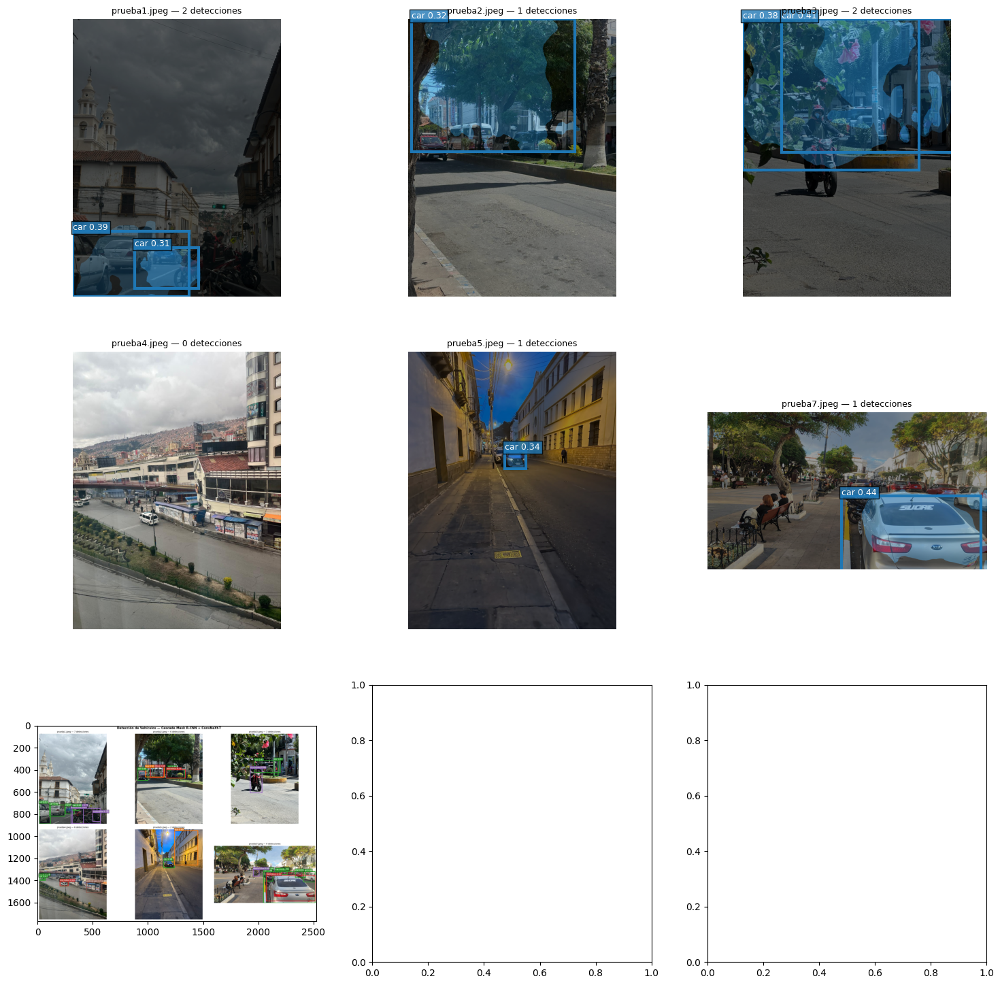

In [12]:
from mmdet.apis import init_detector, inference_detector
from mmdet.utils import register_all_modules
import mmcv, glob, os

register_all_modules(init_default_scope=True)

# Cargar mejor checkpoint
ckpts = sorted(
    glob.glob(str(WORK_DIR / 'best_coco_bbox_mAP_epoch_*.pth')),
    key=os.path.getmtime
)
if not ckpts:
    ckpts = sorted(glob.glob(str(WORK_DIR / '*.pth')), key=os.path.getmtime)

BEST_CKPT = ckpts[-1]
model_infer = init_detector(
    str(base_cfg_path), BEST_CKPT,
    device='cuda:0' if torch.cuda.is_available() else 'cpu'
)
print(f'✅ Modelo cargado: {BEST_CKPT}')

# Carpeta de fotos propias
MIS_FOTOS = Path('./mis_fotos')
MIS_FOTOS.mkdir(exist_ok=True)

mis_imgs = list(MIS_FOTOS.glob('*.jpg')) + \
           list(MIS_FOTOS.glob('*.jpeg')) + \
           list(MIS_FOTOS.glob('*.png'))

if not mis_imgs:
    print(f'⚠️ Pon tus fotos en: {MIS_FOTOS.resolve()}')
else:
    cols = min(3, len(mis_imgs))
    rows = (len(mis_imgs) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(18, rows * 6))
    axes = axes.flatten() if len(mis_imgs) > 1 else [axes]
    colors = plt.cm.tab10.colors

    for ax, img_path in zip(axes, mis_imgs):
        result = inference_detector(model_infer, str(img_path))
        img    = mmcv.imread(str(img_path), channel_order='rgb').copy()
        pred   = result.pred_instances
        scores = pred.scores.cpu().numpy()
        labels = pred.labels.cpu().numpy()
        bboxes = pred.bboxes.cpu().numpy()
        masks  = pred.masks.cpu().numpy() if hasattr(pred, 'masks') else None

        ax.imshow(img)
        detectados = 0
        for i, (score, label, bbox) in enumerate(zip(scores, labels, bboxes)):
            if score < 0.3:
                continue
            detectados += 1
            color = colors[int(label) % len(colors)]
            if masks is not None and i < len(masks):
                overlay = np.zeros_like(img, dtype=np.uint8)
                overlay[masks[i]] = [int(c*255) for c in color[:3]]
                ax.imshow(overlay, alpha=0.4)
            x1, y1, x2, y2 = bbox
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1,
                                      linewidth=3, edgecolor=color, facecolor='none')
            ax.add_patch(rect)
            cls_name = CATEGORY_NAMES[int(label)] if int(label) < len(CATEGORY_NAMES) else str(label)
            ax.text(x1, y1-5, f'{cls_name} {score:.2f}', color='white', fontsize=9,
                    bbox=dict(facecolor=color, alpha=0.8, pad=2))

        ax.set_title(f'{img_path.name} — {detectados} detecciones', fontsize=9)
        ax.axis('off')

    for ax in axes[len(mis_imgs):]:
        ax.set_visible(False)

    fig.suptitle('Segmentación de Instancias — RTMDet-Ins + Fotos propias',
                 fontsize=13, fontweight='bold')
    plt.tight_layout()
    plt.savefig(str(MIS_FOTOS / 'resultado_segmentacion.png'), dpi=150, bbox_inches='tight')
    plt.show()
    print(f'✅ Resultado guardado en: {MIS_FOTOS / "resultado_segmentacion.png"}')

---
## Resumen del pipeline

| Paso | Descripción |
|------|-------------|
| 1 | Verificación del entorno (CUDA, MMDetection) |
| 2 | Configuración de rutas del dataset propio |
| 3 | Exploración del dataset (imágenes, polígonos, clases) |
| 4 | División automática 80% train / 10% val / 10% test |
| 5 | Visualización de muestras con polígonos de segmentación |
| 6 | Registro de VehicleSegDataset en MMDetection |
| 7 | Descarga del config oficial RTMDet-Ins-S |
| 8 | Fine-tuning sobre dataset de vehículos (40 épocas) |
| 9 | Evaluación en TEST con métricas COCO (bbox + segm mAP) |
| 10 | Visualización de predicciones con máscaras |
| 11 | Curvas de pérdida y mAP |
| 12 | Inferencia con fotos propias |

---
*Univ. Joel Galvan — RTMDet-Ins — Dataset propio: car / motorcycle / truck*